Initial setup of data and libraries

In [3]:
import numpy as np
import pandas as pd
import os
import glob
import cv2
import math
import seaborn as sns
import json

sns.set()
sns.set_palette("husl")

Set pathing to files. Currently used Desktop as a root since pathing seemed to fail otherwise. I'll fix this later

Also setting contour extraction to RETR_TREE. I am using contours for shape analsyis and object detection. 

We should enable the following:
1. Use Binary Images for for better accuracy. Apply threshold or canny edge detection.
2. FindContours function will modify the source image, thresh before and after finding contours and store in other variables
3. In openCV, finding white object on black backgrounds

In [4]:
TRAIN_PATH = 'Desktop/Data/stage1_train/'
TEST_PATH = 'Desktop/Data/stage1_test/'

RANDOM_SEED=75

OUTPUT_PATH = './'
CONTOUR_EXTRACT_MODE = cv2.RETR_TREE

Check to make sure paths are valid. In add

In [5]:
train_ids = [x for x in os.listdir(TRAIN_PATH) if os.path.isdir(TRAIN_PATH+x)]
test_ids = [x for x in os.listdir(TEST_PATH) if os.path.isdir(TEST_PATH+x)]

Create a panda dataframe combining all images and marking them as train or test. This will allow us to compare across all images

In [6]:
df = pd.DataFrame({'id':train_ids,'train_or_test':'train'})
df = df.append(pd.DataFrame({'id':test_ids,'train_or_test':'test'}))

df.groupby(['train_or_test']).count()

,id
train_or_test,
test,65
train,670


10% ratio determined of test to train images. Does it mean anything?

Build pathing for individual images

In [7]:
df['path'] = df.apply(lambda x:'Desktop/Data/stage1_{}/{}/images/{}.png'.format(x[1],x[0],x[0]), axis=1)


Notes:

1. Some images are greyscale with black background and nuclei in grayscale intensity
2. Some are color
3. Some are black and white

Below: 
Cluster the image into two groups. Create a histogram and the centroid of the group as color intensity

The purpose will be to determine the dominant colors represented most in each image. Use K-means color clustering in OpenCV. Partition n data points to the nearest mean. The mean of each cluster is the centroid (center).

In [8]:
from sklearn.cluster import KMeans

def centroid_histogram(clt):
    # grab the number of different clusters and create a histogram
    # based on the number of pixels assigned to each cluster
    numLabels = np.arange(0, len(np.unique(clt.labels_)) + 1)
    (hist, _) = np.histogram(clt.labels_, bins = numLabels)
    
    # normalize the histogram, such that it sums to one
    hist = hist.astype("float")
    hist /= hist.sum()
    
    # return the histogram
    return hist

Pattern: For each path, load the image and extract the shape attributes. Then do a kmeans clustering on the rbg format.

TODO: Test how color values for each channel spread across the images

Grayscale values are calculated as average of the three colors and is marked as background and foreground

If foreground is darker than background, mark image to be inverted for processing (because we want images light and backgrounds dark)

Possibly use different methods for RGB to grayscale if results suck

In [9]:
def get_image_info(path, clusters=2):
    image = cv2.imread(path)
    height,width,_ = image.shape
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = image.reshape((image.shape[0] * image.shape[1], 3))
    clt = KMeans(n_clusters = clusters)
    clt.fit(image)
    hist = centroid_histogram(clt)
    
    bg_idx, fg_idx = 0, clusters-1
    if hist[bg_idx] < hist[fg_idx]:
        bg_idx, fg_idx = clusters-1, 0
    
    bg_red, bg_green, bg_blue = clt.cluster_centers_[bg_idx]
    fg_red, fg_green, fg_blue = clt.cluster_centers_[fg_idx]
    
    bg_color = sum(clt.cluster_centers_[bg_idx])/3
    fg_color = sum(clt.cluster_centers_[fg_idx])/3
    max_color_pct = hist[bg_idx]
    min_color_pct = hist[fg_idx]
    
    return (pd.Series([height,width,
                       bg_red, bg_green, bg_blue, bg_color,
                       fg_red, fg_green, fg_blue, fg_color,
                       hist[bg_idx],hist[fg_idx],
                       fg_color < bg_color]))
    


Collect data on images

In [10]:
image_info = os.path.join(OUTPUT_PATH,'images.json')

if os.path.isfile(image_info):
    with open(image_info, 'r') as datafile:
        data = json.load(datafile)
        df = pd.read_json(path_or_buf=data, orient='records')
        data = None
else:
    names = ['height','width',
             'bg_red', 'bg_green', 'bg_blue','bg_color',
             'fg_red', 'fg_green', 'fg_blue','fg_color',
             'bg_color_pct','fg_color_pct','invert']

    df[names] = df['path'].apply(lambda x: get_image_info(x))
    df['shape'] = df[['height','width']].apply(lambda x: '{:04d}x{:04d}'.format(x[0], x[1]), axis=1)

    with open(image_info, 'w') as outfile:
        json.dump(df.to_json(orient='records'), outfile)


In [11]:
len(df['shape'].unique()),len(df['width'].unique()), len(df['height'].unique())

(16, 15, 11)

Image Distribution

In [12]:
%matplotlib inline
from matplotlib import pyplot as plt

In [13]:
agg = df[['shape','train_or_test','id']].groupby(['shape','train_or_test']).count().unstack()
agg.columns = agg.columns.droplevel()

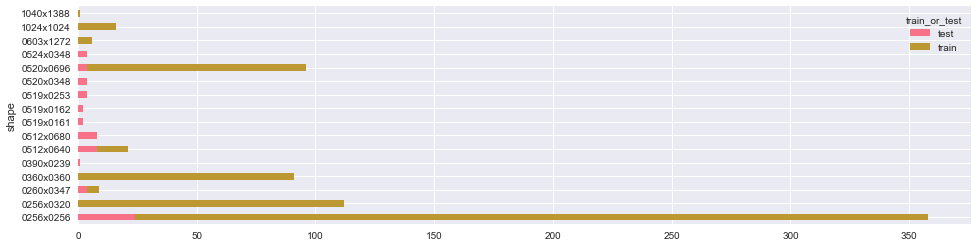

In [14]:
agg.plot.barh(stacked=True,figsize=(16,4))
plt.show()

In [15]:
agg[agg['train'].isnull()]

train_or_test,test,train
shape,,
0390x0239,1.0,NaN
0512x0680,8.0,NaN
0519x0161,2.0,NaN
0519x0162,2.0,NaN
0519x0253,4.0,NaN
0520x0348,4.0,NaN
0524x0348,4.0,NaN


At this point, it looks like there is a very large skew of images concentrated in the 256x256 range.  It also appears that not all image sizes are in test and train. At this point, random sampling of the images at each resolution will be pulled to see exactly what might be in the image file.

In [16]:
def show_image(ax,title,image):
    ax.grid(None)
    ax.set_title(title)
    ax.imshow(image)

In [17]:
def n_of_each(df, n = 4):
    shapes = df['shape'].unique()
    sample = pd.DataFrame()
    
    for shape in shapes:
        sample = sample.append(df[df['shape']==shape].sample(n, replace=True))
    
    return sample.sort_values(by=['shape']).reset_index()

In [18]:
def show_row_col(sample,cols,path_col='path',image_col=None,label_col='title',mode='file'):
    rows = math.ceil(len(sample)/cols)
    
    fig, ax = plt.subplots(rows,cols,figsize=(5*cols,5*rows))
    
    for index, data in sample.iterrows():
    
        title = data[label_col]
        if mode=='image':
            image = np.array(data[image_col],dtype=np.uint8)
            #image = cv2.cvtColor(image,cv2.COLOR_GRAY2RGB)
        else:
            image = cv2.imread(data[path_col])
            image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

        row = index // cols
        col = index % cols
        show_image(ax[row,col],title,image)

    plt.show()    

In [19]:
sample = n_of_each(df)

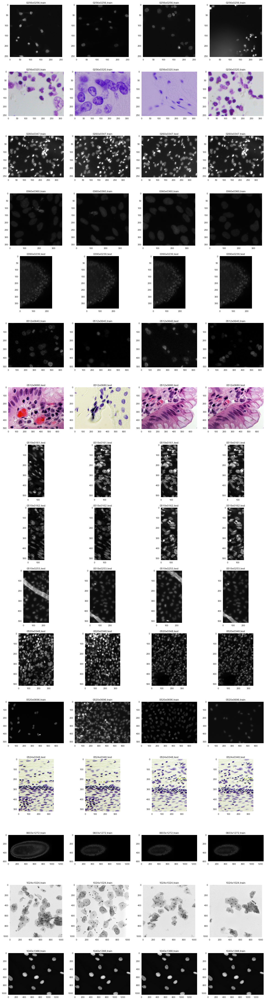

In [20]:
sample['label'] = sample[['shape','train_or_test']].apply(lambda x: '{},{}'.format(x[0],x[1]), axis=1)
show_row_col(sample,4,path_col='path',label_col='label',mode='file')

Rip Mask meta data:
    1. mask_id
    2. separate index number for all mask objects
    3. minimum bounding rectangle
    4. angle of rotation
    5. masked area
    6. length & breadth
Contour identification of mask objects can be extracted and rotated

Bounded roation ensures rotated images is not clipped

In [21]:
def rotate_bound(image, cX, cY, angle, box = None):
    # grab the dimensions of the image and then determine the
    # center
    (h, w) = image.shape[:2]
    #(cX, cY) = (w // 2, h // 2)

    # grab the rotation matrix (applying the negative of the
    # angle to rotate clockwise), then grab the sine and cosine
    # (i.e., the rotation components of the matrix)
    M = cv2.getRotationMatrix2D((cX, cY), -angle, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])

    # compute the new bounding dimensions of the image
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))

    # adjust the rotation matrix to take into account translation
    M[0, 2] += (nW / 2) - cX
    M[1, 2] += (nH / 2) - cY

    # perform the actual rotation and return the image
    return cv2.warpAffine(image, M, (nW, nH)) 

In [22]:
def rotate_points(points,center,origin,angle):
    rbox = np.array(points.copy())
    
    rbox[:,0] -= center[0]
    rbox[:,1] -= center[1]
    
    cos = math.cos(np.radians(angle))
    sin = math.sin(np.radians(angle))
    rmat = [[cos, -sin],
            [sin, cos]]
    
    rbox = np.dot(np.matrix(rbox),rmat)
    
    rbox[:,0] += origin[0]  
    rbox[:,1] += origin[1]
    
    return np.array(rbox)

Given a mask and an image, do the following:
    1. Identify contours in the mask
    2. Apply mask on the image
    3. Identify contours in the mask
    4. For each contour extract metadata about the mask
    5. Extract the nuclei and rotate it to get a clipped horizontal rectangle
   

In [23]:
def extract(mask, image, mask_id, image_id, frame=3):
    _, contours, _ = cv2.findContours(mask, CONTOUR_EXTRACT_MODE, cv2.CHAIN_APPROX_NONE)

    data = []
    
    if len(image.shape) > 2:
        all_nuclei = image.copy()
        for i in range(image.shape[2]):
            all_nuclei[:,:,i] = np.bitwise_and(all_nuclei[:,:,i],mask)
    else:
        all_nuclei = np.bitwise_and(image,mask)

    for contour in contours:
        ((cx, cy), r) =  cv2.minEnclosingCircle(contour)
        rect = cv2.minAreaRect(contour)
        box = cv2.boxPoints(rect)
        angle = rect[2]
    
        x1 = max(0,math.floor(cx-r-frame))
        y1 = max(0,math.floor(cy-r-frame))

        x2 = min(mask.shape[1],math.ceil(cx+r+frame+1))
        y2 = min(mask.shape[0],math.ceil(cy+r+frame+1))

        sq_mask =  mask[y1:y2,x1:x2]
        square =  all_nuclei[y1:y2,x1:x2,:]
        
        offset_cx = int(cx-x1)
        offset_cy = int(cy-y1)
        
        # offset the points
        box[:,0] -= x1
        box[:,1] -= y1
        # print(box)
        
        rotated = rotate_bound(sq_mask,offset_cx,offset_cy,-angle)
        nuclei = rotate_bound(square,offset_cx,offset_cy,-angle)
        rbox = rotate_points(box,(offset_cx,offset_cy),(nuclei.shape[1]/2,nuclei.shape[0]/2),angle)

        xmin, xmax = max(0,math.floor(min(rbox[:,0]))), math.ceil(max(rbox[:,0]))
        ymin, ymax = max(0,math.floor(min(rbox[:,1]))), math.ceil(max(rbox[:,1]))

        #print(xmin,xmax,ymin,ymax)
        nuclei = nuclei[ymin:ymax+1,xmin:xmax+1]
        h = ymax - ymin + 1
        w = xmax - xmin + 1
        if h > w:
            nuclei = rotate_bound(nuclei,int(w/2),int(h/2),90)
            angle = angle -90
            #h,w = nuclei.shape
            
        data.append({
            'image_id':image_id,
            'mask_id':mask_id,
            'nuclei':nuclei.tolist(),
            'width':nuclei.shape[1],
            'height':nuclei.shape[0],
            'cx':cx,
            'cy':cy,
            'square':square.tolist(),
            'offset_cx':offset_cx,
            'offset_cy':offset_cy,
            'radius':r,
            'box':box.tolist(),
            'angle':angle
        })
        
    return(data)

Masks are in the masks directory and each mask is a different file

In [24]:
# lambda function to flatten a list

flatten = lambda l: [item for sublist in l for item in sublist]

In [26]:
def get_masks(image_id, prefix, invert=False, enhance=True):
    
    image_file = '{}/{}/images/{}.png'.format(prefix,image_id,image_id)
    image = cv2.imread(image_file) #, cv2.IMREAD_GRAYSCALE)
    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    
    if enhance:
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3,3))
        for channel in range(image.shape[2]):
            image[:,:,channel] = clahe.apply(image[:,:,channel])

    if invert:
        image = np.invert(image)

    data = []
    mask_files = glob.glob(os.path.join('{}/{}/masks/'.format(prefix,image_id),'*.png'))
    
    index = 0
    for mask_file in mask_files:
        mask = cv2.imread(mask_file, cv2.IMREAD_GRAYSCALE)
        mask_id = os.path.basename(mask_file).split('.')[0]
        info = extract(mask, image, mask_id, image_id)
        
        data.append(info)
        index +=1 
    
    return(flatten(data))

In [27]:
train = df[df['train_or_test'] == 'train'][['id','invert']]

In [28]:
prefix = 'Desktop/Data/stage1_train'
data = train.apply(lambda x: get_masks(x[0],prefix,x[1]), axis = 1)
data = flatten(data)
masks = pd.DataFrame(data)
mdf = masks.merge(df[['id','shape','invert']],how='inner', on=None, left_on = 'image_id', right_on='id')

In [29]:
print(len(masks),list(masks.columns))

30370 ['angle', 'box', 'cx', 'cy', 'height', 'image_id', 'mask_id', 'nuclei', 'offset_cx', 'offset_cy', 'radius', 'square', 'width']


In [30]:
mdf = masks.merge(df[['id','shape','invert']],how='inner', on=None, left_on = 'image_id', right_on='id')

Processing
Images below show the original, one of the masks, masked image and extracted square

In [31]:
def show_process(df):
    
    rows = len(df)
    fix, ax = plt.subplots(rows,6,figsize=(5*6,5*rows))
    for row,data in df.iterrows():

        image_file = '{}/{}/images/{}.png'.format(prefix,data['image_id'],data['image_id'])
        image = cv2.imread(image_file)
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        show_image(ax[row,0],'original {}'.format(data['shape']),image)

        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3,3))
        enhanced = image.copy()
        for channel in range(enhanced.shape[2]):
            enhanced[:,:,channel] = clahe.apply(enhanced[:,:,channel])

        circled = cv2.circle(enhanced, (int(data['cx']),int(data['cy'])), 
                             int(data['radius']+3), 
                             color=(255,255,0), thickness=3) 
        show_image(ax[row,1],'enhanced',circled)

        mask_file = '{}/{}/masks/{}.png'.format(prefix,data['image_id'],data['mask_id'])
        mask = cv2.imread(mask_file,cv2.IMREAD_GRAYSCALE)
        
        circled = cv2.cvtColor(mask,cv2.COLOR_GRAY2RGB)
        circled = cv2.circle(circled, (int(data['cx']),int(data['cy'])), 
                             int(data['radius']+3), 
                             color=(255,255,0), thickness=3) 

        show_image(ax[row,2],'mask',circled)

        masked_image = enhanced.copy()
        if data['invert']:
            masked_image = np.invert(masked_image)

        for channel in range(masked_image.shape[2]):
            masked_image[:,:,channel] = np.bitwise_and(masked_image[:,:,channel],mask)

        circled = cv2.circle(masked_image, (int(data['cx']),int(data['cy'])), 
                             int(data['radius']+3), 
                             color=(0,255,255), thickness=3) 
        show_image(ax[row,3],'inverted & masked',cv2.cvtColor(circled,cv2.COLOR_BGR2RGB))

        square = np.array(data['square'], dtype=np.uint8)
        circled = cv2.circle(square, (int(data['offset_cx']),int(data['offset_cy'])), 
                             int(data['radius']+3), 
                             color=(255,255,0), thickness=1) 
        
        show_image(ax[row,4],'Cropped',circled)

        nuclei = np.array(data['nuclei'], dtype=np.uint8)
        show_image(ax[row,5],'rotated and clipped',nuclei)



The images below show the processing steps followed to extract the final nuclei. There is one example of each sample from the training set. I added a circle on the images to show the original location and to show that the nuclei on edges can be clipped based on which edge they are on.

    Original image
    Image after applying contrast stretch
    A mask for the image
    After converting dark on bright to bright on dark and applying the mask
    Extracting a square. the circle shows the original center.
    Rotating the image so that long edge is horizontal and clipping the boundaries.



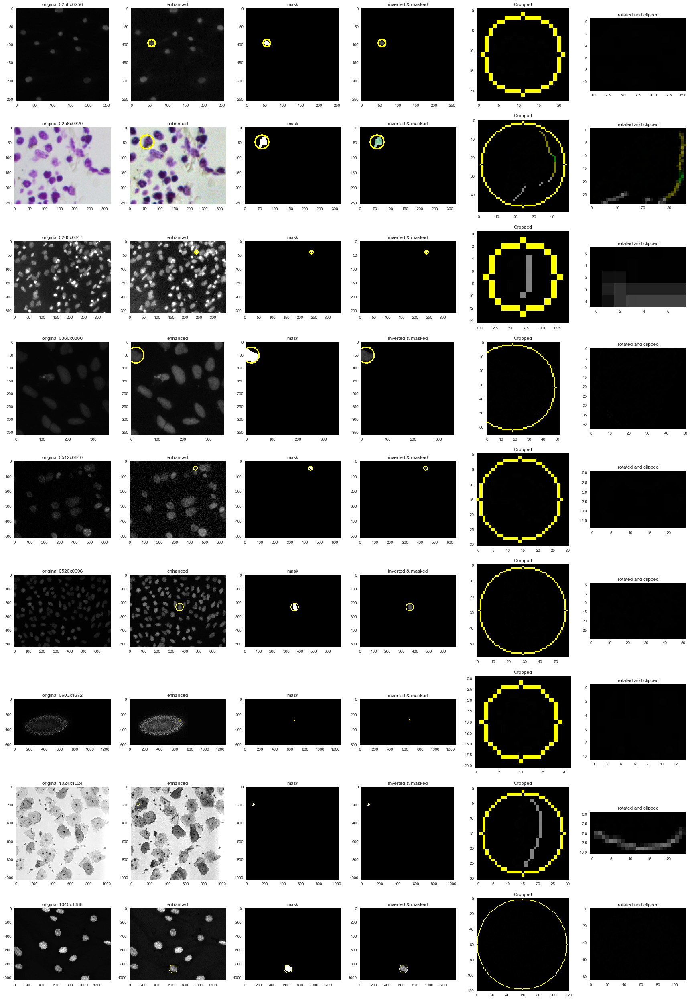

In [32]:


detail = mdf[mdf['image_id'].isin(sample['id'])]
sample_one = n_of_each(detail,n=1)

show_process(sample_one)



Masks with holes

In [33]:
nuclei_by_mask = mdf[['mask_id','image_id']].groupby(['mask_id']).count().reset_index()
nuclei_by_mask = nuclei_by_mask.rename(columns={"image_id": "count"})
nuclei_by_mask = nuclei_by_mask[nuclei_by_mask['count']>1]
nuclei_by_mask = nuclei_by_mask.sort_values(by=['count'], ascending=False).reset_index()

nuclei_by_mask.head()

,index,mask_id,count
0,11010,5e6e650a28e22f651817b2edeacbf93a960adf633f1dbe...,14
1,3144,1aeeabd9b2b9f2e6869bf1f57eb6c7e2ef18a63e52efc3...,13
2,10075,55f0ae548d4e94dd750c50ece134492949d698344c192f...,12
3,783,06b8def182e553e87aecc354a1d93163c2f8b9ba90445b...,11
4,9757,538045d56284c15f786bee67e3197f9c6bbb0fbe8200a1...,11


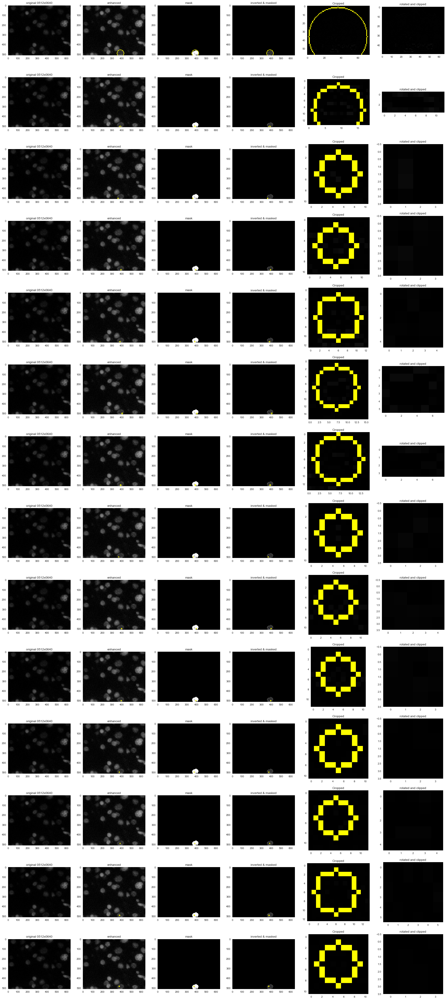

In [34]:
data = mdf[mdf['mask_id'] == nuclei_by_mask.loc[0]['mask_id']].copy().reset_index()

show_process(data)

Mask has identified holes. CV2 will identify the contours. 

In [35]:
holes_in_masks = mdf[mdf['mask_id'].isin(nuclei_by_mask['mask_id'].unique())].copy().reset_index()

In [36]:
CONTOUR_EXTRACT_MODE = cv2.RETR_EXTERNAL

In [37]:
masks_info = os.path.join(OUTPUT_PATH,'masks.json')
data = train.apply(lambda x: get_masks(x[0],prefix,x[1]), axis = 1)
data = flatten(data)
masks = pd.DataFrame(data) 
with open(masks_info, 'w') as outfile:
    json.dump(data, outfile)

In [38]:


mdf = masks.merge(df[['id','shape','invert']],how='inner', on=None, left_on = 'image_id', right_on='id')
len(mdf)



29462

In [39]:
count_by_mask = mdf[['mask_id','image_id']].groupby(['mask_id']).count().reset_index()
count_by_mask = count_by_mask.rename(columns={"image_id": "count"})

count_by_mask = count_by_mask[count_by_mask['count']>1].copy().reset_index()
count_by_mask

,index,mask_id,count
0,295,02a35a786c7b8b7713c0c976662902b705f4a2eeab72fb...,2
1,925,07ce0bd7ec64d713a3c85ca8bdf2e3ba6f74fcdb7666cc...,2
2,965,08337590bf675e664ad9de338b91dcabbbe33f22e66369...,2
3,3327,1c5b7b494ce7b9adae4ea8b8936e229cec9acb9ce22337...,2
4,4151,239c7212fd64c489c39eb4bf360b58f896ab8c0c12042f...,2
5,4314,2521b5f6459633c6f324a1e4e514a60044e90d121df5e1...,2
6,4613,27a4c059dd8c8ce70de7c382e6de88bf197d9b8dde17b7...,2
7,4762,28dadbf3c30995bbc3a2cf1d1669a62fc4b8fcf5d47da0...,2
8,5775,31eb01c368f2a75ccf4735d241f97aa24cf9821c65a6b0...,2
9,9645,52a0da01e7292a55903c626bad32cb224d74013aed8dce...,2


Masks with gaps


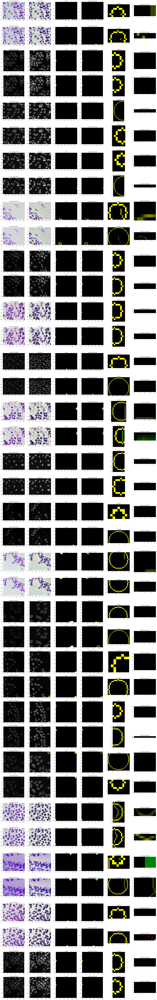

In [40]:


split_masks = mdf[mdf['mask_id'].isin(count_by_mask['mask_id'].unique())].copy().reset_index()

show_process(split_masks)



In [41]:
def tag_anomaly(label,df):
    if type(df) == 'pandas.core.series.Series':
        items = df[['image_id','mask_id']].copy()
    else:
        items = df[['image_id','mask_id']].copy().drop_duplicates()
    items['issue'] = label
    
    return(items)

In [42]:
anomalies = pd.DataFrame()
anomalies = anomalies.append(tag_anomaly('Holes in mask',holes_in_masks))
anomalies = anomalies.append(tag_anomaly('Split mask',split_masks))

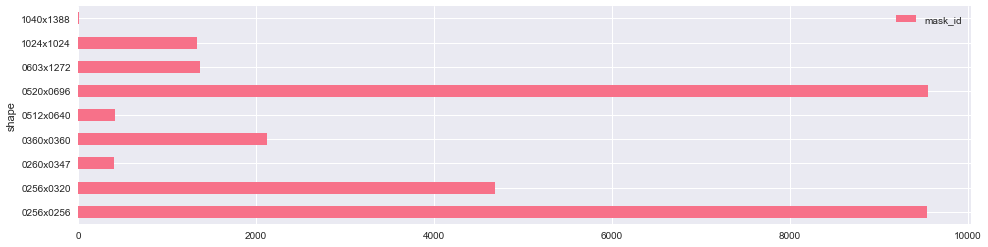

In [43]:
agg = mdf[['shape','mask_id']].groupby(['shape']).count()
#agg.columns = agg.columns.droplevel()
agg.plot.barh(stacked=True,figsize=(16,4))
plt.show()

In [44]:
len(mdf[mdf['shape']=='1040x1388'])

14

The distribution of the number of nuclei identified by different shapes is also quite wide. There are four images sizes where the total number of nuclei identified is greater than 2000.

In [45]:
agg = mdf[['shape','mask_id','image_id']].groupby(['shape','image_id']).count().reset_index()
agg.groupby(['shape'])['mask_id'].agg(['mean','min','max','std']).reset_index()

,shape,mean,min,max,std
0,0256x0256,28.571856,1,101,21.346405
1,0256x0320,41.857143,1,151,30.744767
2,0260x0347,81.600000,1,132,52.576611
3,0360x0360,23.340659,5,43,5.254035
4,0512x0640,31.692308,13,54,12.263663
5,0520x0696,103.858696,4,369,75.010121
6,0603x1272,229.500000,68,375,103.213856
7,1024x1024,83.812500,44,136,28.126426
8,1040x1388,14.000000,14,14,NaN


In [46]:
nuclei_sample = n_of_each(mdf,8)

In [47]:
len(nuclei_sample)/8

9.0

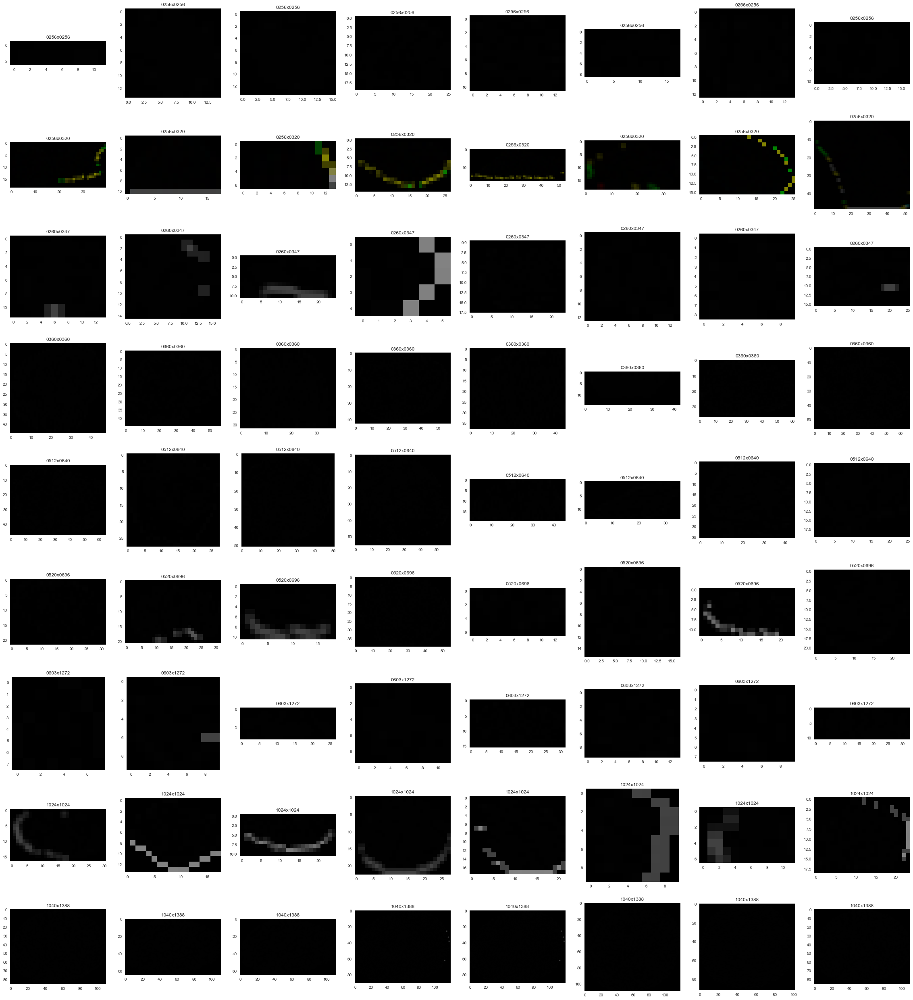

In [48]:
show_row_col(nuclei_sample,8,image_col='nuclei',label_col='shape',mode='image')

Add contrast stretching to make nuclei more visible. 

Very small nuclei
Filtering the data set by the resulting height and width less than 10 pixels,

In [49]:
len(mdf[mdf['height'] < 3])

125

In [50]:
def show_mask(mdf, mask_id, prefix):
    image_id = mdf[mdf['mask_id']==mask_id]['image_id'].squeeze()
    image_file = '{}/{}/images/{}.png'.format(prefix,image_id,image_id)
    mask_file = '{}/{}/masks/{}.png'.format(prefix,image_id,mask_id) 
    
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image,cv2.COLOR_BGRA2RGB)
    
    mask = cv2.imread(mask_file,cv2.IMREAD_GRAYSCALE)
    mask = cv2.cvtColor(mask,cv2.COLOR_GRAY2RGB)
    
    fig,ax = plt.subplots(1,2,figsize = (20,20))
    ax[0].grid(None)
    ax[0].imshow(image)
    ax[1].set_title('Image')
    ax[1].grid(None)
    ax[1].imshow(mask)
    ax[1].set_title('Mask')

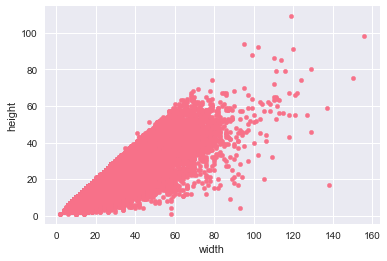

In [51]:
mdf.plot.scatter('width','height')
plt.show()

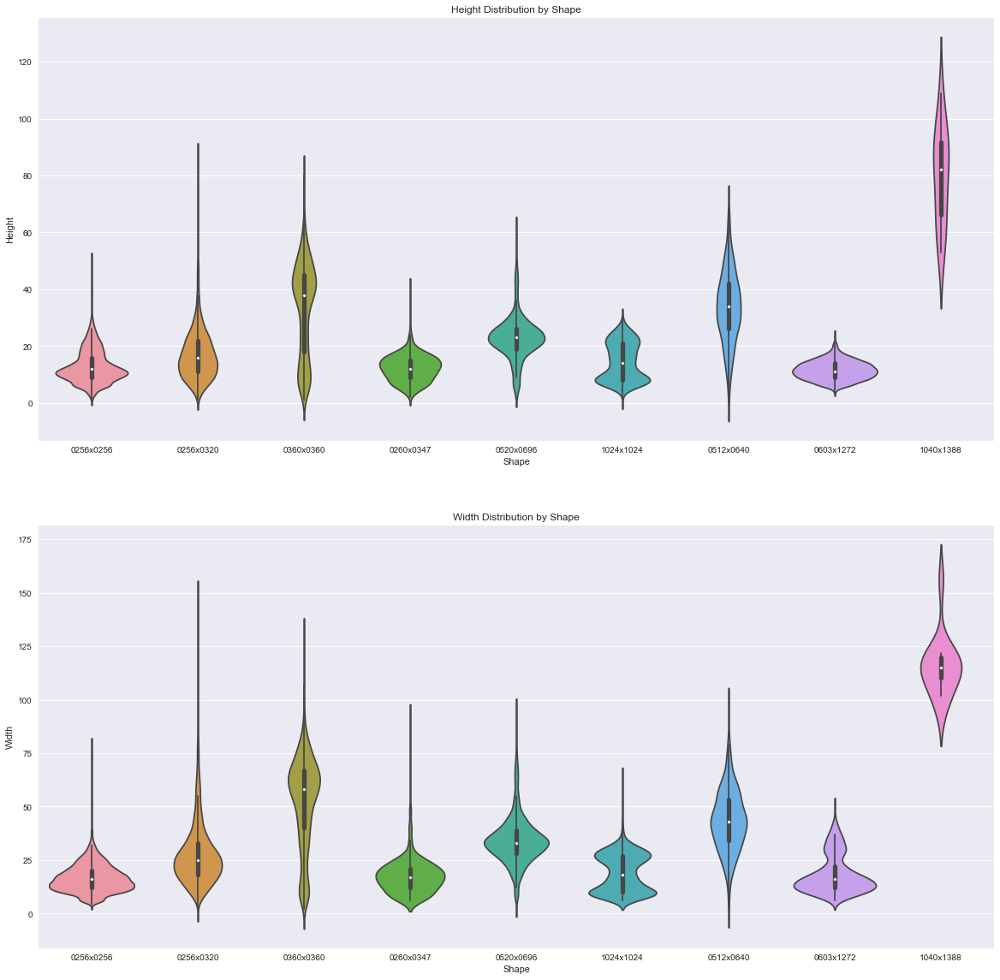

In [52]:
fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=mdf, ax = axes[0])
axes[0].set_title('Height Distribution by Shape')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=mdf, ax = axes[1])
axes[1].set_title('Width Distribution by Shape')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()



Overall size distribution of the nuclei

    The largest resolution 1040x1388 has larger nuclei width averaging around 110.
    Most of the remaining shapes have average width between 10 & 30
    One outlier is the 360x360 where there are groups which are generally bigger than 40, but there a re quite a few which are smaller than 20.



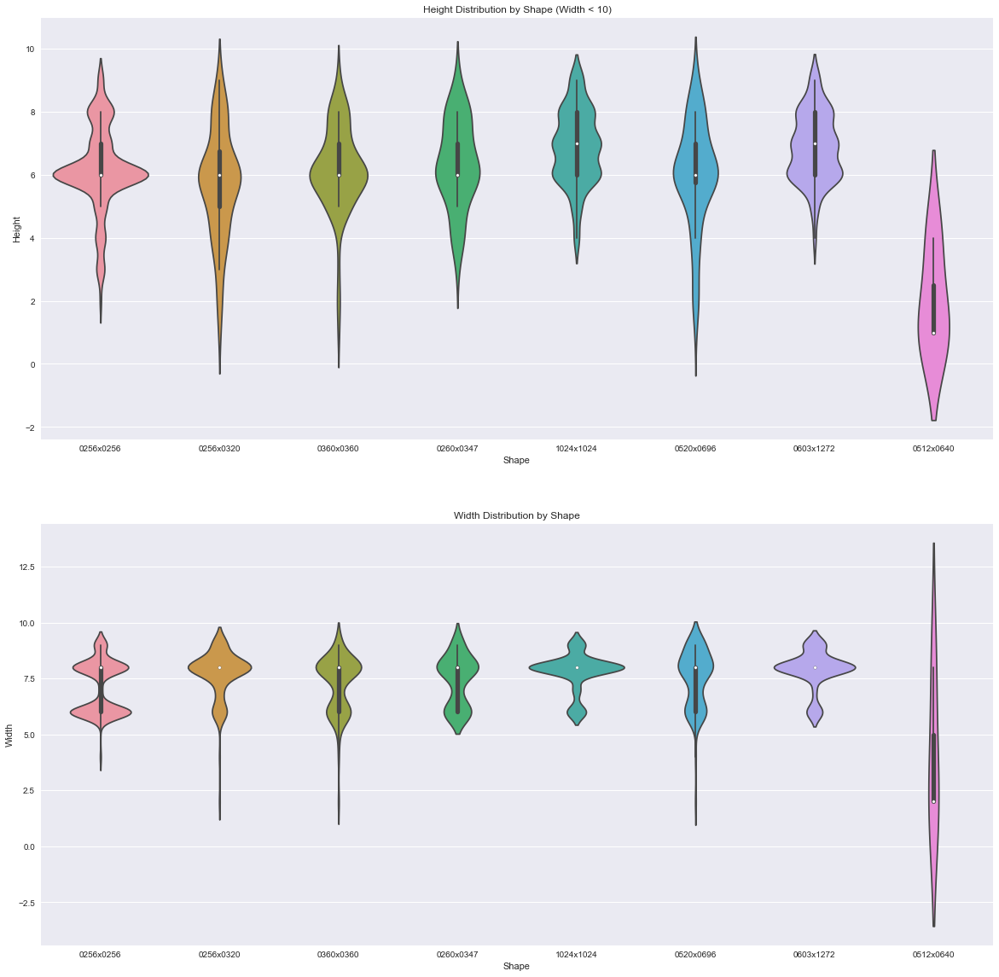

In [53]:
small = mdf[mdf['width'] < 10]

fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=small, ax = axes[0])
axes[0].set_title('Height Distribution by Shape (Width < 10)')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=small, ax = axes[1])
axes[1].set_title('Width Distribution by Shape')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()



Interesting distribution of the nuclei image sizes. When width is less that 10 pixels, the height also is less than 10, however there are images where height is less than 10 but the width is greater than 10

    Smaller sized (<5px) images are mostly in the image sizes 256x256, 256x360, and 360x360
    Rest of the images have larger overall images with few outliers in the smaller sizes



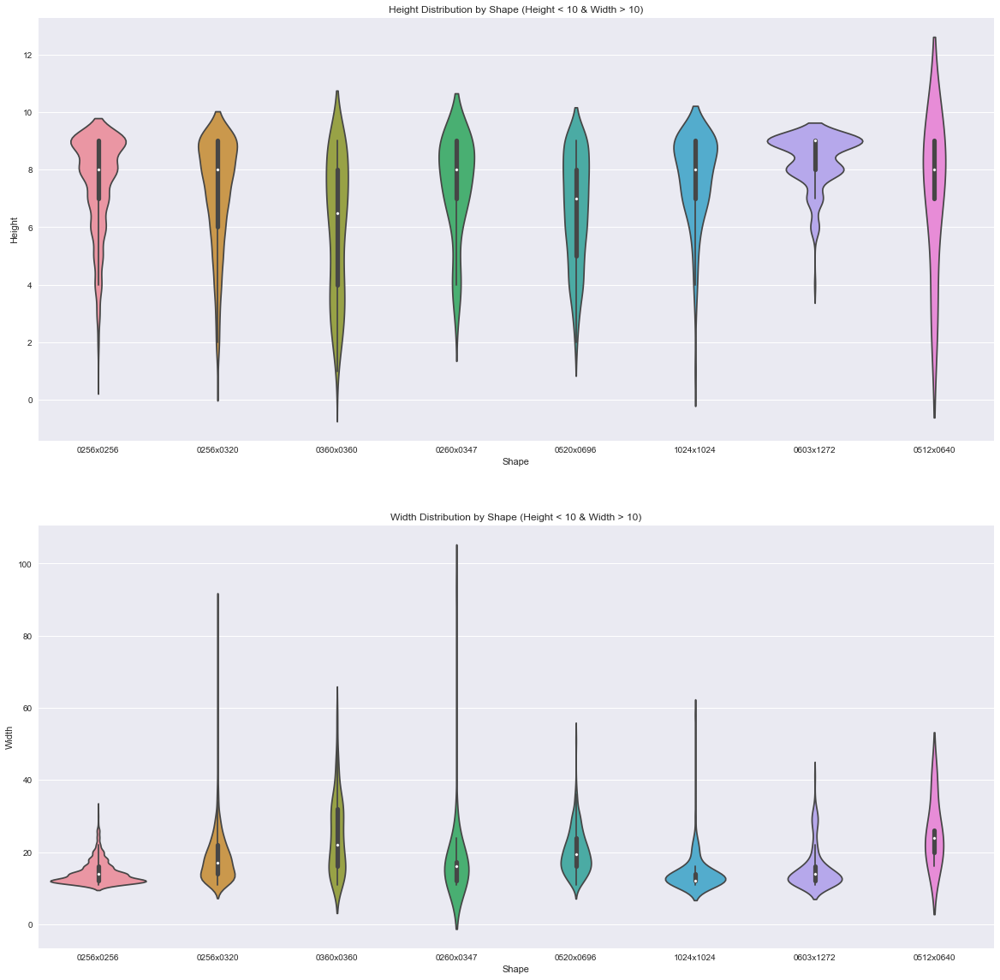

In [54]:
small = mdf[mdf['height'] < 10]
small = small[small['width']> 10]

fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=small, ax = axes[0])
axes[0].set_title('Height Distribution by Shape (Height < 10 & Width > 10)')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=small, ax = axes[1])
axes[1].set_title('Width Distribution by Shape (Height < 10 & Width > 10)')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()

There seem to be some extreme cases where height is less than 10pixels but the width is greater than 30

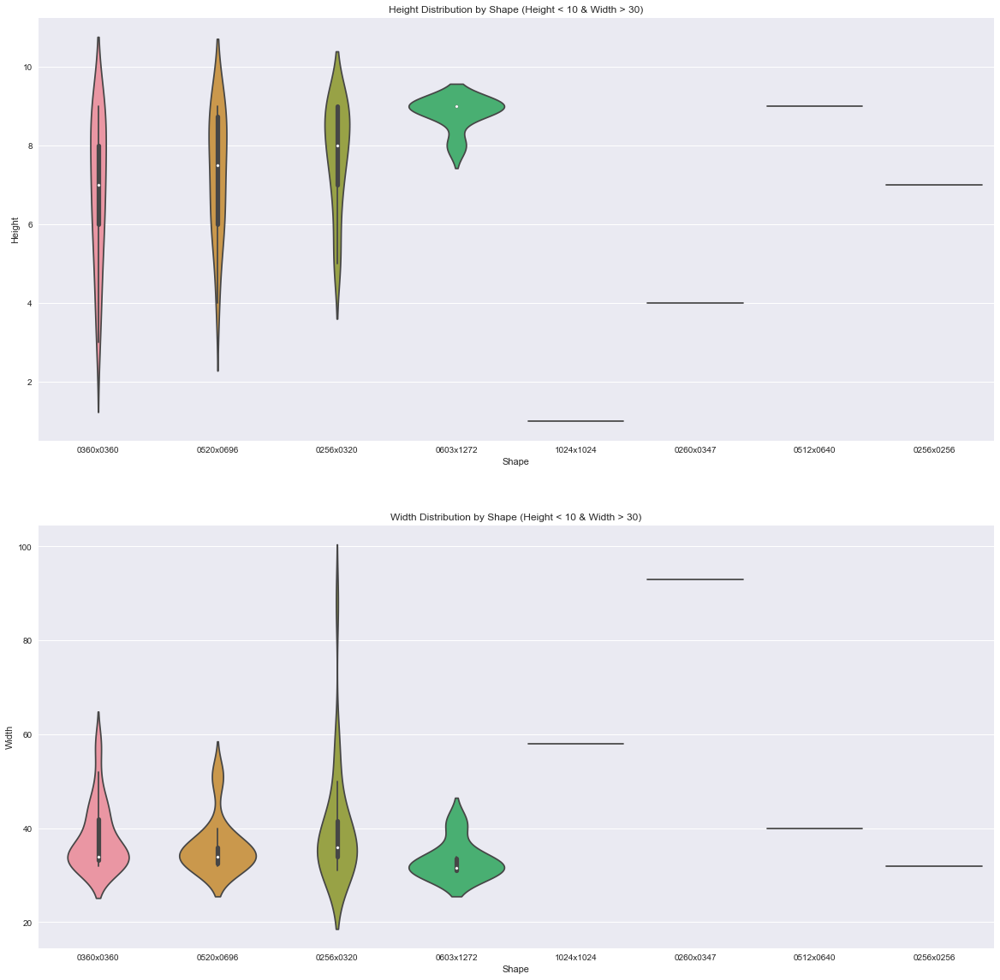

In [55]:
small = mdf[(mdf['height'] < 10) & (mdf['width']> 30)]

fig, axes = plt.subplots(2,1, figsize=(20,20))
sns.violinplot('shape','height', data=small, ax = axes[0])
axes[0].set_title('Height Distribution by Shape (Height < 10 & Width > 30)')

axes[0].yaxis.grid(True)
axes[0].set_xlabel('Shape')
axes[0].set_ylabel('Height')

sns.violinplot('shape','width', data=small, ax = axes[1])
axes[1].set_title('Width Distribution by Shape (Height < 10 & Width > 30)')

axes[1].yaxis.grid(True)
axes[1].set_xlabel('Shape')
axes[1].set_ylabel('Width')

plt.show()

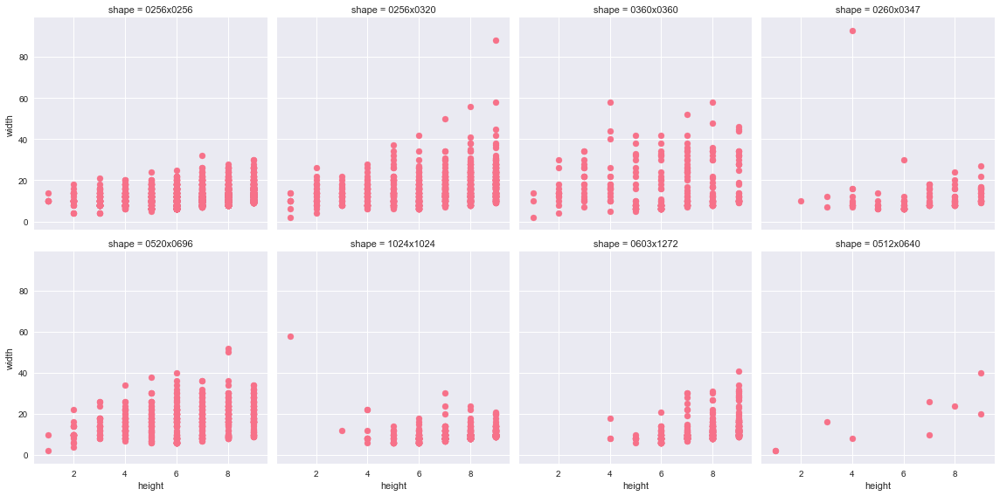

In [56]:
small = mdf[mdf['height'] < 10]

g = sns.FacetGrid(small,col="shape", col_wrap=4, size = 4)
g = g.map(plt.scatter, "height", "width")

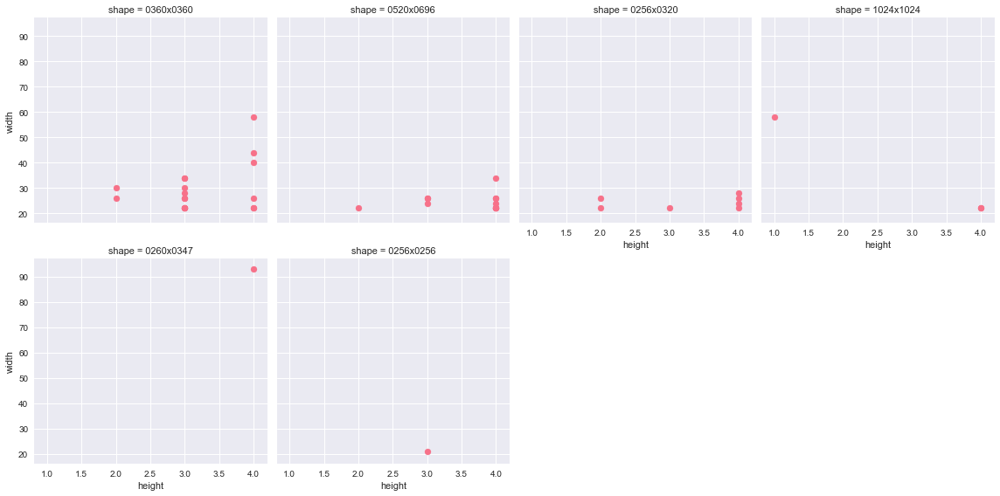

In [57]:
small = mdf[(mdf['height'] < 5) & (mdf['width'] > 20)]

g = sns.FacetGrid(small,col="shape", col_wrap=4, size = 4)
g = g.map(plt.scatter, "height", "width")

In [58]:
len(small)

42

Ditribution of the nuclei counts identified in images by shape of original image

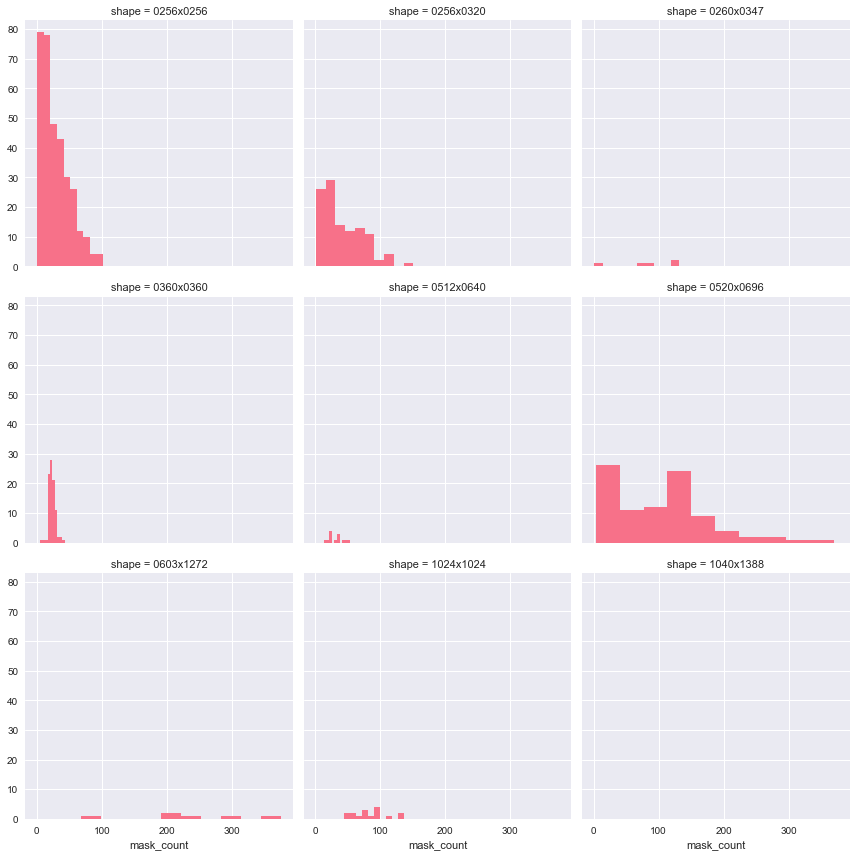

In [59]:
agg = mdf[['image_id','shape','mask_id']].groupby(['shape','image_id']).count().reset_index()
agg = agg.rename(columns={'mask_id':'mask_count'})

g = sns.FacetGrid(agg ,col="shape", size = 4,  sharex="none", col_wrap=3)
g = g.map(plt.hist,'mask_count')

Overall distribution of the number of nuclei annotated by image.

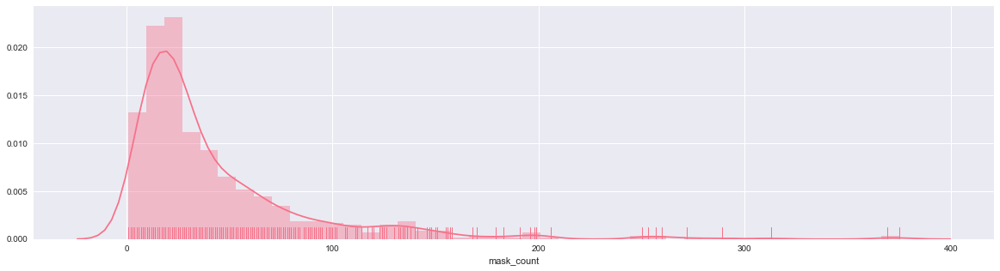

In [60]:
agg = mdf[['image_id','mask_id']].groupby(['image_id']).count().reset_index()
agg = agg.rename(columns={'mask_id':'mask_count'})

fig, ax = plt.subplots(figsize=(20,5))
sns.distplot(agg['mask_count'],ax=ax,rug=True)
plt.show()

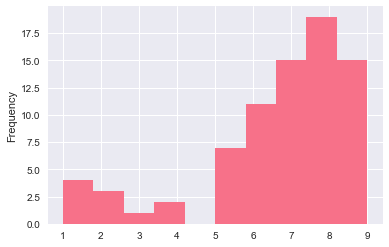

In [61]:
agg.loc[agg['mask_count']<10,'mask_count'].plot.hist()
plt.show()

There are very few images with nuclei count less than 5

In [62]:
agg[agg['mask_count']<4]

,image_id,mask_count
94,220b37f4ca7cab486d2b71cd87a46ee7411a5aa142799d...,1
241,58c593bcb98386e7fd42a1d34e291db93477624b164e83...,2
332,7b38c9173ebe69b4c6ba7e703c0c27f39305d9b2910f46...,1
351,84eeec681987753029eb83ea5f3ff7e8b5697783cdb203...,1
385,93c5638e7e6433b5c9cc87c152bcbe28873d2f9d6a392c...,1
462,af576e8ec3a8d0b57eb6a311299e9e4fd2047970d3dd9d...,2
505,bf4a61bb81589c9a67e3343408befd3e135af5e88b50c1...,3
602,e5aeb5b3577abbebe8982b5dd7d22c4257250ad3000661...,2


Processing details where only a single nuclei is annotated.

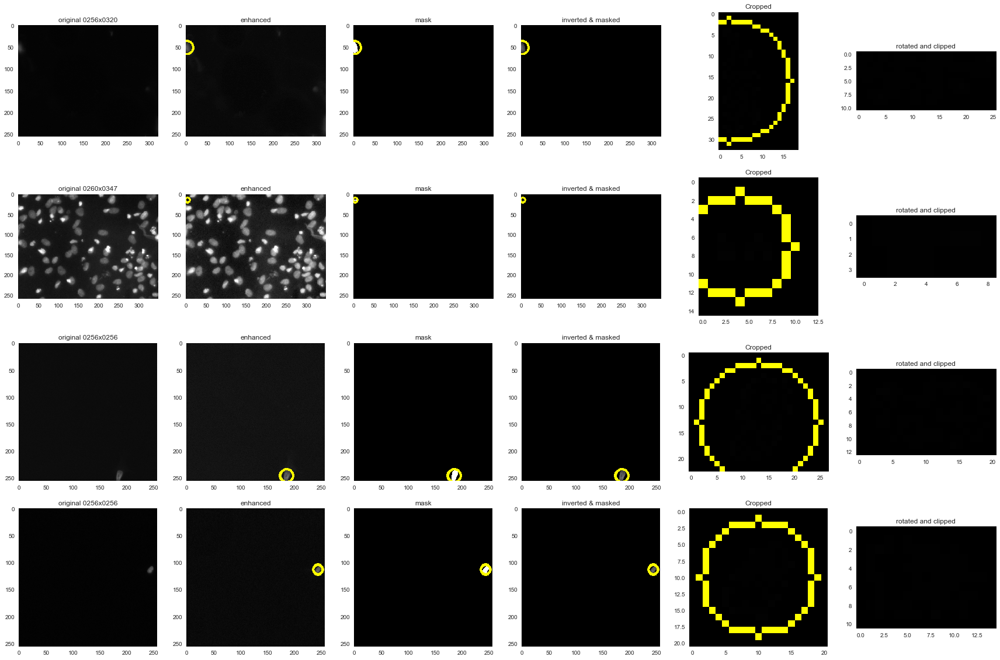

In [63]:
low_count = mdf[mdf['image_id'].isin(agg.loc[agg['mask_count']<2,'image_id'].unique())].copy().reset_index()

show_process(low_count)

In [64]:
anomalies = anomalies.append(tag_anomaly('Invalid Masks',low_count.loc[2]))



The third one in the above set has already been identified an incorrect train file. This is missing annotations.

Processing details where only two nuclei are annotated.


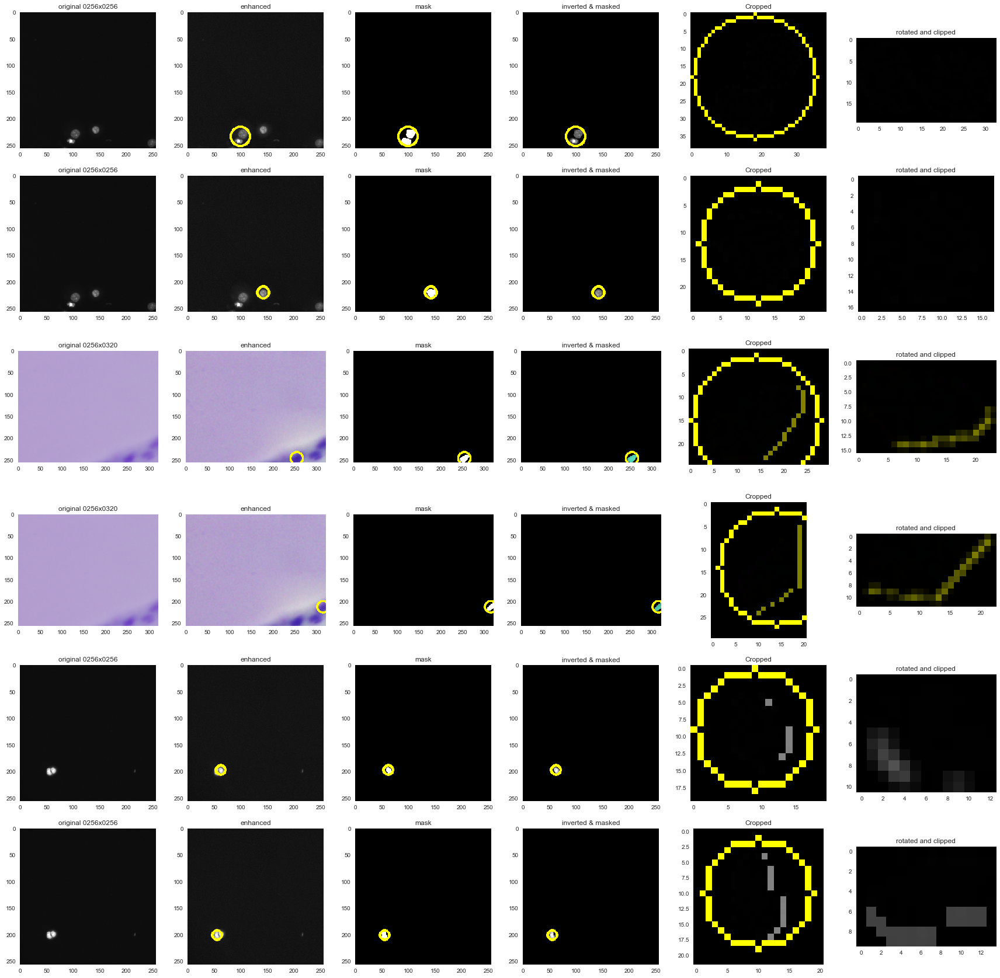

In [65]:
low_count = mdf[mdf['image_id'].isin(agg.loc[agg['mask_count']==2,'image_id'].unique())].copy().reset_index()

show_process(low_count)

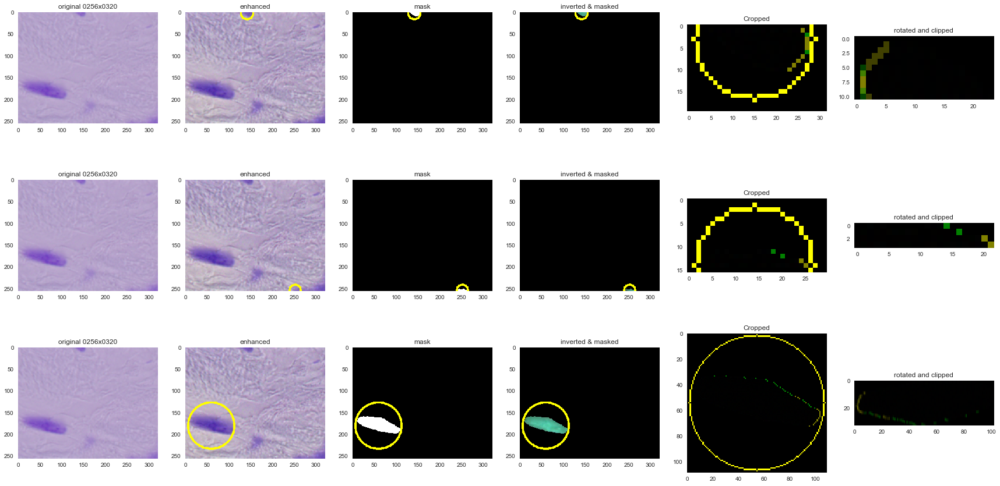

In [66]:
low_count = mdf[mdf['image_id'].isin(agg.loc[agg['mask_count']==3,'image_id'].unique())].copy().reset_index()

show_process(low_count)

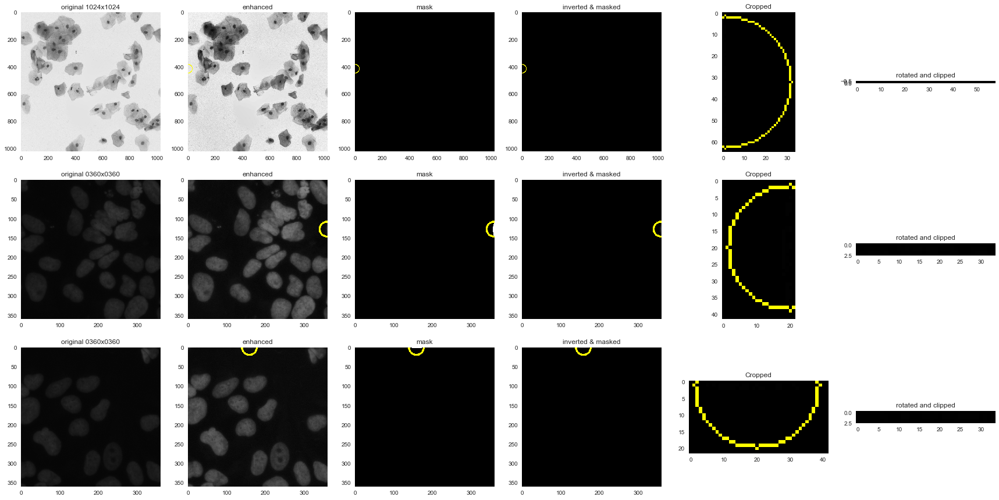

In [67]:


abnormal = mdf[(mdf['height'] < 4) & 
               (mdf['width'] > 30)].copy().reset_index()
show_process(abnormal)



In [68]:
anomalies = anomalies.append(tag_anomaly('Look like lines',abnormal))

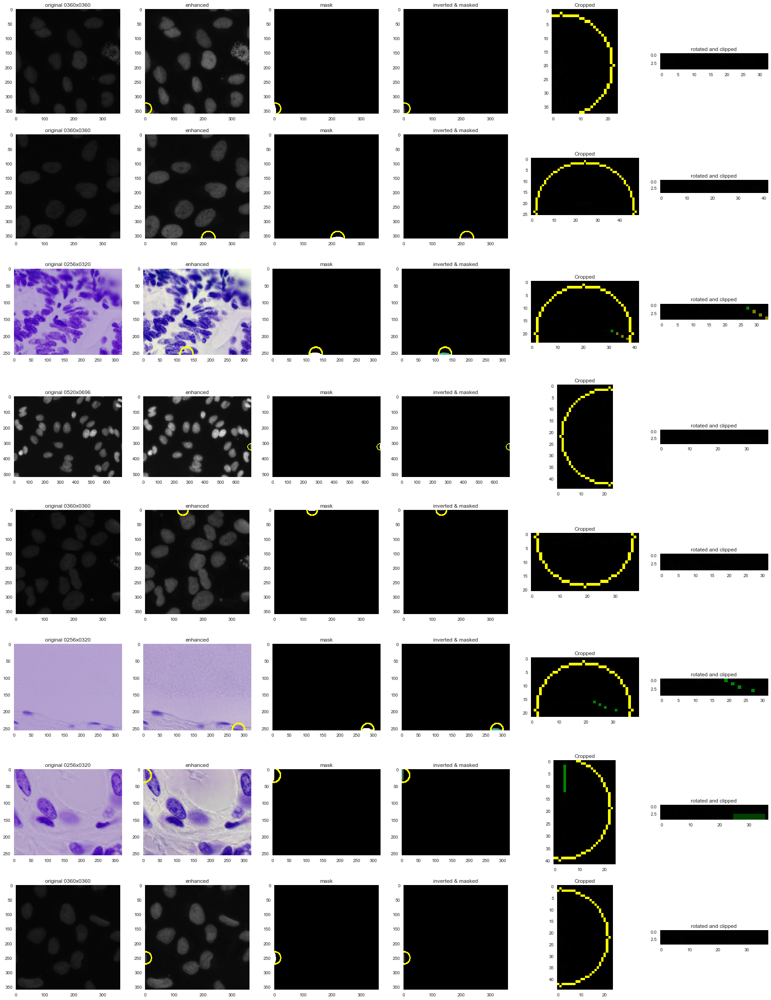

In [69]:
abnormal = mdf[(mdf['height'] < 6) & 
               (mdf['height'] > 4) & 
               (mdf['width'] > 30)].copy().reset_index()
len(abnormal)
show_process(abnormal)



In [70]:
anomalies = anomalies.append(tag_anomaly('Look like lines',abnormal.loc[0]))

In [71]:
with open(os.path.join(OUTPUT_PATH,'anomalies.json'), 'w') as outfile:
    json.dump(anomalies.to_json(orient='records'), outfile)

In [72]:
agg = anomalies[['issue','mask_id']].groupby('issue').count()
agg = agg.rename(columns={'mask_id':'counts'})
agg

,counts
issue,
Holes in mask,443
Invalid Masks,1
Look like lines,4
Split mask,20
